In [1]:
import os
import pandas as pd   # importing and manipulating data
import numpy as np    # for performing linear algebric functions
import matplotlib.pyplot as plt    #visualization of data
plt.style.use('ggplot')
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import re
from nltk.tokenize import WordPunctTokenizer
tok = WordPunctTokenizer()


import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

from wordcloud import WordCloud, STOPWORDS

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

from iso3166 import countries

In [2]:
vaccine_df = pd.read_csv('E:/Project 5 credits/Final Project/Covid Vaccine/covidvaccine.csv',low_memory=False, lineterminator='\n')
vaccine_df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,MyNewsNE,Assam,MyNewsNE a dedicated multi-lingual media house...,24-05-2020 10:18,64.0,11.0,110.0,False,18-08-2020 12:55,Australia to Manufacture Covid-19 Vaccine and ...,['CovidVaccine'],Twitter Web App,False
1,Shubham Gupta,NaN,I will tell about all experiences of my life f...,14-08-2020 16:42,1.0,17.0,0.0,False,18-08-2020 12:55,#CoronavirusVaccine #CoronaVaccine #CovidVacci...,"['CoronavirusVaccine', 'CoronaVaccine', 'Covid...",Twitter for Android,False
2,Journal of Infectiology,NaN,Journal of Infectiology (ISSN 2689-9981) is ac...,14-12-2017 07:07,143.0,566.0,8.0,False,18-08-2020 12:46,Deaths due to COVID-19 in Affected Countries\n...,NaN,Twitter Web App,False
3,Zane,NaN,Fresher than you.,18-09-2019 11:01,29.0,25.0,620.0,False,18-08-2020 12:45,@Team_Subhashree @subhashreesotwe @iamrajchoco...,NaN,Twitter for Android,False
4,Ann-Maree O’Connor,"Adelaide, South Australia",Retired university administrator. Melburnian b...,24-01-2013 14:53,83.0,497.0,10737.0,False,18-08-2020 12:45,@michellegrattan @ConversationEDU This is what...,NaN,Twitter Web App,False


In [3]:
vaccine_df.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 161251 entries, 0 to 161250
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   user_name         161247 non-null  object 
 1   user_location     128420 non-null  object 
 2   user_description  152109 non-null  object 
 3   user_created      161247 non-null  object 
 4   user_followers    161246 non-null  float64
 5   user_friends      161246 non-null  object 
 6   user_favourites   161246 non-null  object 
 7   user_verified     161246 non-null  object 
 8   date              161245 non-null  object 
 9   text              161246 non-null  object 
 10  hashtags          109731 non-null  object 
 11  source            161098 non-null  object 
 12  is_retweet        161241 non-null  object 
dtypes: float64(1), object(12)
memory usage: 16.0+ MB


In [4]:
#These data are identified as objects so we have to convert them 
vaccine_df['user_favourites'] = pd.to_numeric(vaccine_df['user_favourites'],errors = 'coerce')
vaccine_df['user_friends'] = pd.to_numeric(vaccine_df['user_friends'],errors = 'coerce')

#Converted true false in to 1 and 0
vaccine_df['user_verified'] = vaccine_df['user_verified'].replace("False",0)
vaccine_df['user_verified'] = vaccine_df['user_verified'].replace("True",1)

# dropped NaN values in the user followers column
vaccine_df= vaccine_df[vaccine_df['user_followers'].notna()]

In [5]:
vaccine_df.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 161246 entries, 0 to 161250
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   user_name         161242 non-null  object 
 1   user_location     128415 non-null  object 
 2   user_description  152104 non-null  object 
 3   user_created      161246 non-null  object 
 4   user_followers    161246 non-null  float64
 5   user_friends      161242 non-null  float64
 6   user_favourites   161242 non-null  float64
 7   user_verified     161246 non-null  object 
 8   date              161245 non-null  object 
 9   text              161246 non-null  object 
 10  hashtags          109731 non-null  object 
 11  source            161098 non-null  object 
 12  is_retweet        161241 non-null  object 
dtypes: float64(3), object(10)
memory usage: 17.2+ MB


In [6]:
vaccine_df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,MyNewsNE,Assam,MyNewsNE a dedicated multi-lingual media house...,24-05-2020 10:18,64.0,11.0,110.0,0,18-08-2020 12:55,Australia to Manufacture Covid-19 Vaccine and ...,['CovidVaccine'],Twitter Web App,False
1,Shubham Gupta,NaN,I will tell about all experiences of my life f...,14-08-2020 16:42,1.0,17.0,0.0,0,18-08-2020 12:55,#CoronavirusVaccine #CoronaVaccine #CovidVacci...,"['CoronavirusVaccine', 'CoronaVaccine', 'Covid...",Twitter for Android,False
2,Journal of Infectiology,NaN,Journal of Infectiology (ISSN 2689-9981) is ac...,14-12-2017 07:07,143.0,566.0,8.0,0,18-08-2020 12:46,Deaths due to COVID-19 in Affected Countries\n...,NaN,Twitter Web App,False
3,Zane,NaN,Fresher than you.,18-09-2019 11:01,29.0,25.0,620.0,0,18-08-2020 12:45,@Team_Subhashree @subhashreesotwe @iamrajchoco...,NaN,Twitter for Android,False
4,Ann-Maree O’Connor,"Adelaide, South Australia",Retired university administrator. Melburnian b...,24-01-2013 14:53,83.0,497.0,10737.0,0,18-08-2020 12:45,@michellegrattan @ConversationEDU This is what...,NaN,Twitter Web App,False


In [7]:
vaccine_df.describe()

,user_followers,user_friends,user_favourites
count,1.612460e+05,161242.000000,1.612420e+05
mean,4.845731e+04,1660.748825,1.451980e+04
std,6.157126e+05,7623.732115,3.723817e+04
min,0.000000e+00,0.000000,0.000000e+00
25%,1.440000e+02,203.000000,4.940000e+02
50%,6.180000e+02,577.000000,2.869000e+03
75%,2.710000e+03,1483.750000,1.170600e+04
max,1.481140e+07,455317.000000,1.216116e+06


In [8]:
print('Shape of tweets dataframe : {}'.format(vaccine_df.shape))

Shape of tweets dataframe : (161246, 13)


<AxesSubplot:>

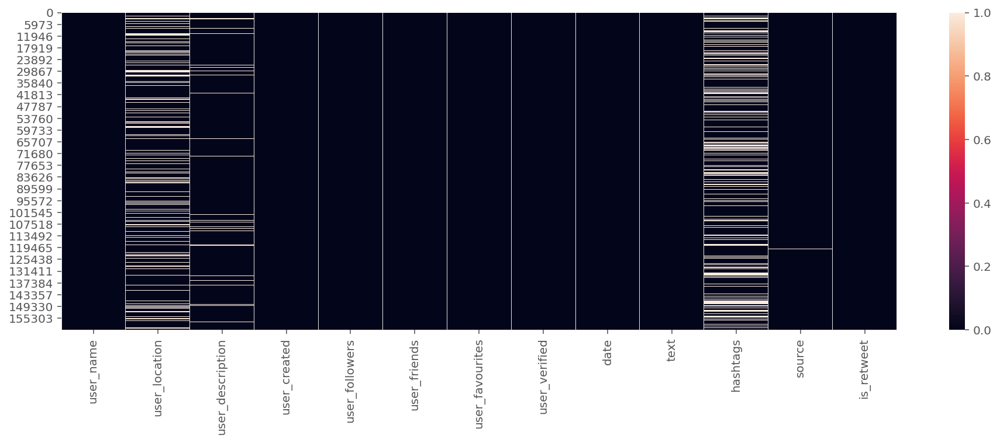

In [9]:
plt.figure(figsize = (16,5))
sns.heatmap(vaccine_df.isnull())

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

def return_missing_values(data_frame):
    missing_values = data_frame.isnull().sum()/len(data_frame)
    missing_values = missing_values[missing_values>0]
    missing_values.sort_values(inplace=True)
    return missing_values

def plot_missing_values(data_frame):
    missing_values = return_missing_values(data_frame)
    missing_values = missing_values.to_frame()
    missing_values.columns = ['Precentage']
    missing_values.index.names = ['Name']
    missing_values['Name'] = missing_values.index
    sns.set(style='whitegrid', color_codes=True)
    sns.barplot(x='Name', y='Precentage', data=missing_values)
    plt.xticks(rotation=90)
    plt.show()

In [11]:
return_missing_values(vaccine_df)

date                0.000006
user_name           0.000025
user_friends        0.000025
user_favourites     0.000025
is_retweet          0.000031
source              0.000918
user_description    0.056696
user_location       0.203608
hashtags            0.319481
dtype: float64

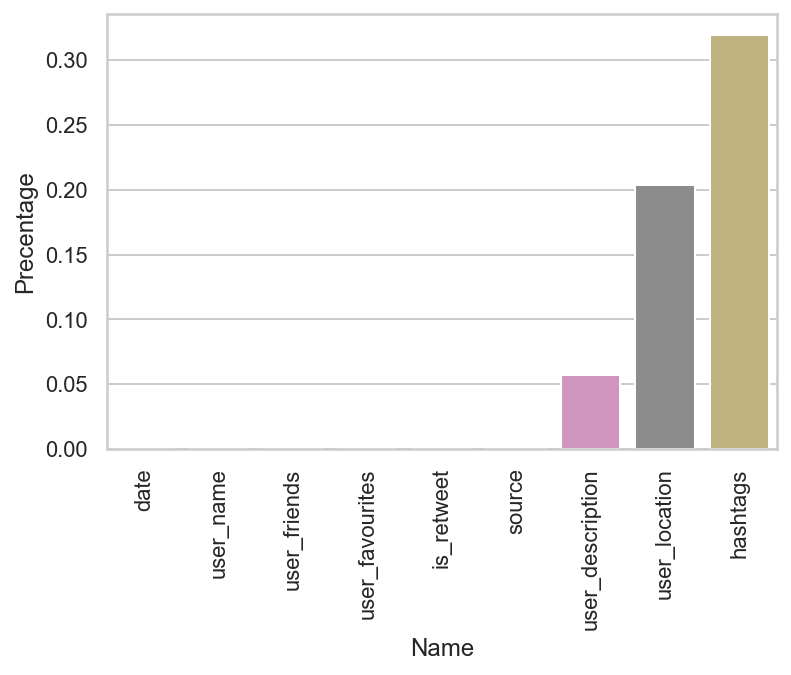

In [12]:
plot_missing_values(vaccine_df)

In [13]:
vaccine_df.corr()

,user_followers,user_friends,user_favourites
user_followers,1.000000,0.000788,-0.020439
user_friends,0.000788,1.000000,0.229099
user_favourites,-0.020439,0.229099,1.000000


Text(0.5, 1.0, 'Correlation Heatmap')

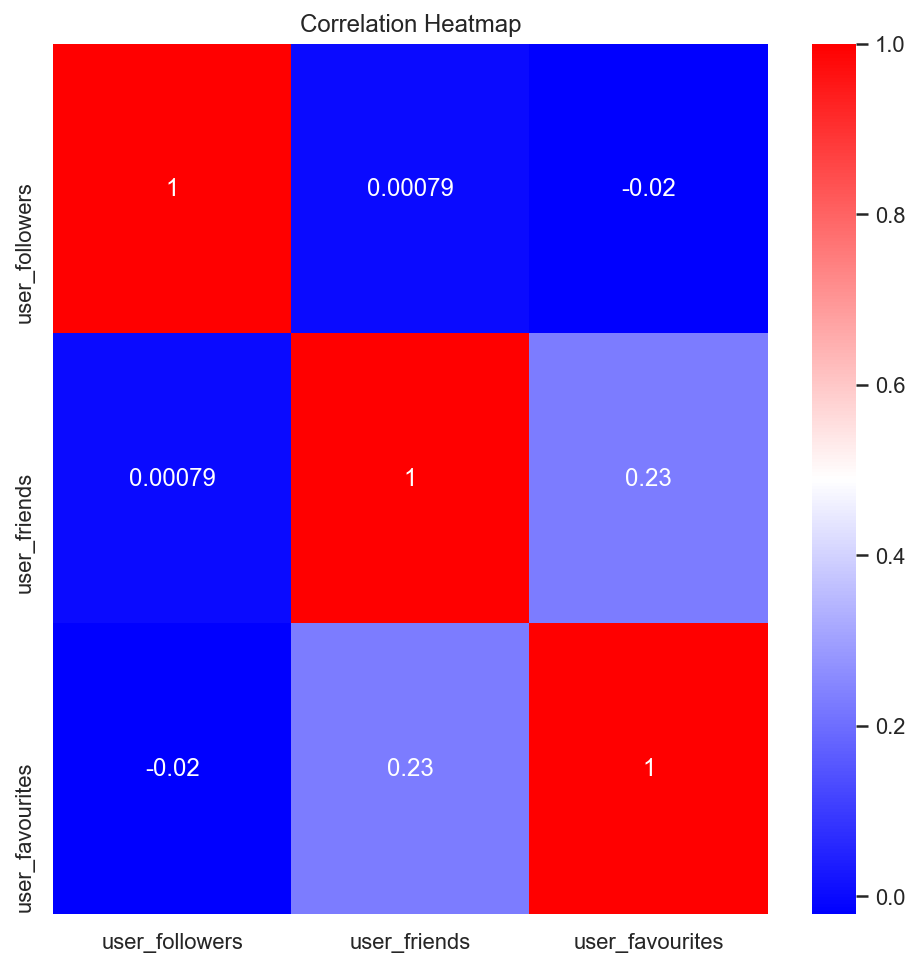

In [14]:
plt.figure(figsize=(8,8))
sns.heatmap(vaccine_df.corr(), annot=True, cmap="bwr").set_title('Correlation Heatmap')

In [15]:
df_new = vaccine_df['user_name'].value_counts().reset_index()
df_new.columns = ['user_name', 'tweets_count']
df_new = df_new.sort_values(['tweets_count'])

fig = px.bar(
    df_new.tail(20), 
    x="tweets_count", 
    y="user_name", 
    orientation='h', 
    title='Top 20 users by number of tweets', 
    width=800, 
    height=800
)

fig.show()

In [16]:
vaccine_df.tail(5)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
161246,Multivalent Dirk Haussecker,RNA World,Biotech stock addict. Trained in RNAi. Love gr...,2011-11-10 12:00:58,11708.0,371.0,9176.0,0,2021-03-11 22:30:23,$ABUS totally missing in action. Nothing on mR...,"['covidvaccine', 'sarscov2']",Twitter Web App,False
161247,Craig Brown 🏳️‍🌈,"Melbourne, Victoria",writer. dad. husband. exvangelical. type 1. le...,2012-06-20 16:47:27,397.0,838.0,9927.0,0,2021-03-11 22:30:05,"“It’s not a race,” says man already vaccinated...","['vaccine', 'auspol', 'CovidVaccine', 'ScottyF...",Twitter for iPhone,False
161248,Faith in New York,"New York, USA",Building power in New York faith institutions ...,2013-06-04 21:34:33,3122.0,2569.0,6663.0,0,2021-03-11 22:29:58,⚠️PSA FOR COVID-19 VACCINE⚠️\n\nIf you live in...,"['Bronx', 'Harlem']",Twitter for iPhone,False
161249,Openly Black & Queer & Adrian 🎵🎬⚖️,In My Bag,CashApp $inga4hire 💰 // #MeToo Fellow //Spelma...,2009-09-16 15:33:00,460.0,523.0,30867.0,0,2021-03-11 22:29:56,My doctor: Like to schedule your #CovidVaccine...,['CovidVaccine'],Twitter for Android,False
161250,⛄️🌈,SA & NT (rotation),The message is in the 'demeaning'.\nQuality co...,2020-02-02 06:45:45,399.0,375.0,14188.0,0,2021-03-11 22:29:54,@M_McCormackMP serves up a litany of excuses f...,"['LNPfail', 'CovidVaccine']",Twitter for Android,False


In [17]:
covidvaccine_df = pd.merge(vaccine_df, df_new, on='user_name')

In [18]:
covidvaccine_df.head(5)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,tweets_count
0,MyNewsNE,Assam,MyNewsNE a dedicated multi-lingual media house...,24-05-2020 10:18,64.0,11.0,110.0,0,18-08-2020 12:55,Australia to Manufacture Covid-19 Vaccine and ...,['CovidVaccine'],Twitter Web App,False,2
1,MyNewsNE,Assam,MyNewsNE a dedicated multi-lingual media house...,2020-05-24 10:18:41,91.0,34.0,495.0,0,2020-11-18 12:45:20,Pfizer Inc said on Wednesday that final result...,['CovidVaccine'],Twitter Web App,False,2
2,Shubham Gupta,NaN,I will tell about all experiences of my life f...,14-08-2020 16:42,1.0,17.0,0.0,0,18-08-2020 12:55,#CoronavirusVaccine #CoronaVaccine #CovidVacci...,"['CoronavirusVaccine', 'CoronaVaccine', 'Covid...",Twitter for Android,False,1
3,Journal of Infectiology,NaN,Journal of Infectiology (ISSN 2689-9981) is ac...,14-12-2017 07:07,143.0,566.0,8.0,0,18-08-2020 12:46,Deaths due to COVID-19 in Affected Countries\n...,NaN,Twitter Web App,False,1
4,Zane,NaN,Fresher than you.,18-09-2019 11:01,29.0,25.0,620.0,0,18-08-2020 12:45,@Team_Subhashree @subhashreesotwe @iamrajchoco...,NaN,Twitter for Android,False,1


In [19]:
data = covidvaccine_df.sort_values('user_followers', ascending=False)
data = data.drop_duplicates(subset='user_name', keep="first")
data = data[['user_name', 'user_followers', 'tweets_count']]
data = data.sort_values('user_followers')

fig = px.bar(
    data.tail(20), 
    x="user_followers", 
    y="user_name", 
    color='tweets_count',
    orientation='h', 
    title='Top 20 users by number of followers', 
    width=1000, 
    height=800
)

fig.show()

In [20]:
data.tail(5)

,user_name,user_followers,tweets_count
35528,Hindustan Times,7897396.0,36
3463,ABP News,10945937.0,25
10632,The Times Of India,13432632.0,30
133461,CGTN,13674387.0,1
15537,NDTV,14811399.0,190


In [21]:
#Just split day and time into separate columns
#Here there are errors in the line so had to change the code

covidvaccine_df['user_created'] = pd.to_datetime(covidvaccine_df['user_created'],  errors='coerce') 
covidvaccine_df = covidvaccine_df.sort_values(['user_created'])

covidvaccine_df['created_day'] = covidvaccine_df['user_created'].astype(str).str.split(' ', expand=True)[0]
covidvaccine_df['created_time'] = covidvaccine_df['user_created'].astype(str).str.split(' ', expand=True)[1]
covidvaccine_df.head()


,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,tweets_count,created_day,created_time
105150,Marcia Dorsey🌻⚜️🗽,The CITY of St. Louis,Mother of @jack... Does that make me the grand...,2006-04-03 16:00:21,12699.0,3814.0,153565.0,1,2021-01-29 14:45:31,#CovidVaccine Accomplished 🙏🏻,['CovidVaccine'],Twitter for iPhone,False,2,2006-04-03,16:00:21
105149,Marcia Dorsey🌻⚜️🗽,"DowntownSTL, MO.",Mother of @jack... Does that make me the grand...,2006-04-03 16:00:21,12550.0,3808.0,153049.0,1,2021-01-24 00:29:06,Thank you all for sharing your #CovidVaccine ...,"['CovidVaccine', 'TheMoreYouKnow']",Twitter for iPhone,False,2,2006-04-03,16:00:21
43362,Chris Messina 🥂,"Oakland, CA",#️⃣ Hashtag inventor ⠀ 🏆 #1 Product Hunter ⠀ S...,2006-07-16 06:53:48,108418.0,6640.0,26366.0,1,2020-12-26 06:45:03,Fascinating decoding of the #CovidVaccine:\n\n...,['CovidVaccine'],Twitter for iPhone,False,1,2006-07-16,06:53:48
55267,Caz,NaN,"Writers, Readers, LGBT progress/advocacy. Thea...",2006-07-17 23:49:42,764.0,899.0,36452.0,0,2020-12-30 17:13:46,Mississippi to open 18 drive-through locations...,['Covid_19'],Twitter for iPad,False,1,2006-07-17,23:49:42
26541,Sumon Sadhu,NaN,Entrepreneur. Angel investor in cos like @benc...,2006-09-08 20:39:02,3466.0,3131.0,4119.0,0,2020-11-09 15:11:22,Congratulations to Biontech. \n\nPfizer is the...,"['COVID19', 'covidvaccine']",Twitter for iPhone,False,1,2006-09-08,20:39:02


In [22]:
covidvaccine_df['created_day'] = pd.to_datetime(covidvaccine_df['created_day'])
covidvaccine_df['year_created'] = covidvaccine_df['created_day'].dt.year
data = covidvaccine_df.drop_duplicates(subset='user_name', keep="first")
data = data[data['year_created']>1970]
data = data['year_created'].value_counts().reset_index()
data.columns = ['year', 'number']

fig = px.bar(
    data, 
    x="year", 
    y="number", 
    orientation='v', 
    title='User created year by year', 
    width=800, 
    height=600
)

fig.show()

In [23]:
data.head()

,year,number
0,2009.0,13207
1,2020.0,9623
2,2011.0,8009
3,2012.0,6698
4,2010.0,6688


In [24]:
ds = covidvaccine_df['user_location'].value_counts().reset_index()
ds.columns = ['user_location', 'count']
ds = ds[ds['user_location']!='NA']
ds = ds.sort_values(['count'])

fig = px.bar(
    ds.tail(20), 
    x="count", 
    y="user_location", 
    orientation='h', title='Top 20 user locations by number of tweets', 
    width=800, 
    height=800
)

fig.show()

In [25]:
ds.head()

,user_location,count
11444,Westminster & City of London,1
15264,"Tiverton, England",1
15263,Grey side of the moon,1
15262,"Saint Helier, Bailiwick of Jersey",1
15261,🌹 The North,1


In [26]:
def pie_count(data, field, percent_limit, title):
    
    data[field] = data[field].fillna('NA')
    data = data[field].value_counts().to_frame()

    total = data[field].sum()
    data['percentage'] = 100 * data[field]/total    

    percent_limit = percent_limit
    otherdata = data[data['percentage'] < percent_limit] 
    others = otherdata['percentage'].sum()  
    maindata = data[data['percentage'] >= percent_limit]

    data = maindata
    other_label = "Others(<" + str(percent_limit) + "% each)"
    data.loc[other_label] = pd.Series({field:otherdata[field].sum()}) 
    
    labels = data.index.tolist()   
    datavals = data[field].tolist()
    
    trace=go.Pie(labels=labels,values=datavals)

    layout = go.Layout(
        title = title,
        height=600,
        width=600
        )
    
    fig = go.Figure(data=[trace], layout=layout)
    iplot(fig)
    
pie_count(covidvaccine_df, 'user_location', 0.5, 'Number of tweets per location')

In [27]:
from string import punctuation
from nltk.corpus import stopwords
print(stopwords.words('english')[10:15])

def punctuation_stopwords_removal(sms):
    # filters charecter-by-charecter : ['h', 'e', 'e', 'l', 'o', 'o', ' ', 'm', 'y', ' ', 'n', 'a', 'm', 'e', ' ', 'i', 's', ' ', 'p', 'u', 'r', 'v', 'a']
    remove_punctuation = [ch for ch in sms if ch not in punctuation]
    # convert them back to sentences and split into words
    remove_punctuation = "".join(remove_punctuation).split()
    filtered_sms = [word.lower() for word in remove_punctuation if word.lower() not in stopwords.words('english')]
    return filtered_sms

["you've", "you'll", "you'd", 'your', 'yours']


In [28]:
from wordcloud import WordCloud, STOPWORDS


def draw_word_cloud(df, location, title):
    loc_df = df.loc[df.user_location==location]
    loc_df.loc[:, 'text'] = loc_df['text'].apply(punctuation_stopwords_removal)
    word_cloud = WordCloud(
                    background_color='black',
                    stopwords=set(STOPWORDS),
                    max_words=100,
                    max_font_size=50,
                    scale=5,
                    random_state=1).generate(str(loc_df['text']))
    fig = plt.figure(1, figsize=(10,10))
    plt.axis('off')
    fig.suptitle(title, fontsize=20)
    fig.subplots_adjust(top=2.3)
    plt.imshow(word_cloud)
    plt.show()    

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



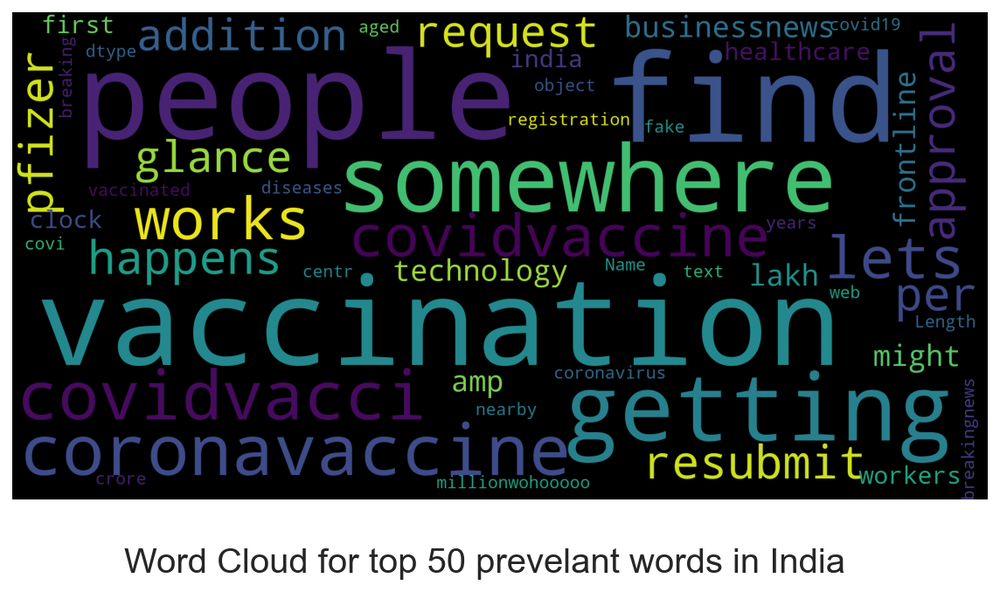

In [29]:
draw_word_cloud(covidvaccine_df, 'India', 'Word Cloud for top 50 prevelant words in India')

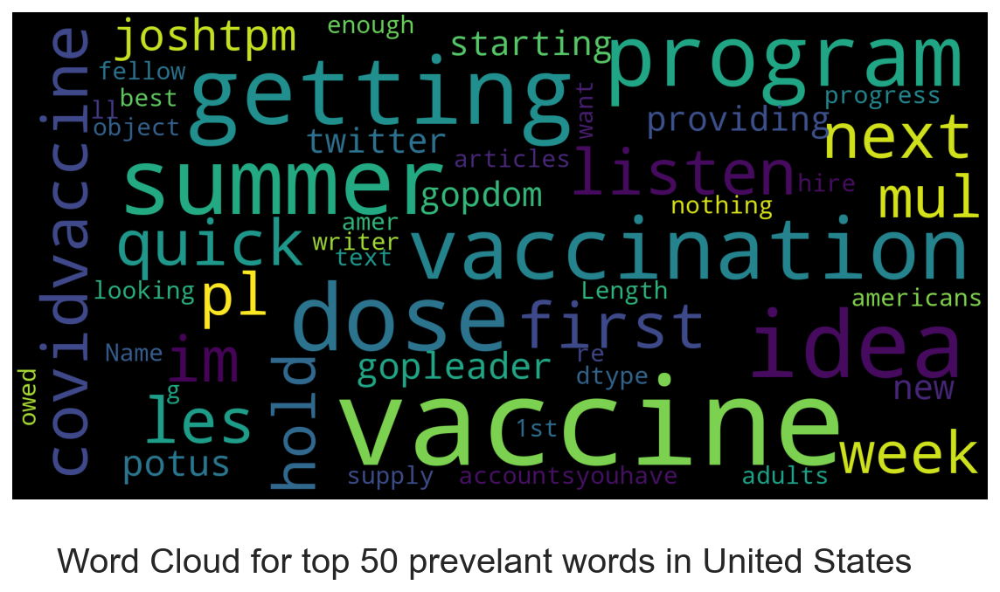

In [30]:
draw_word_cloud(covidvaccine_df, 'United States', 'Word Cloud for top 50 prevelant words in United States')

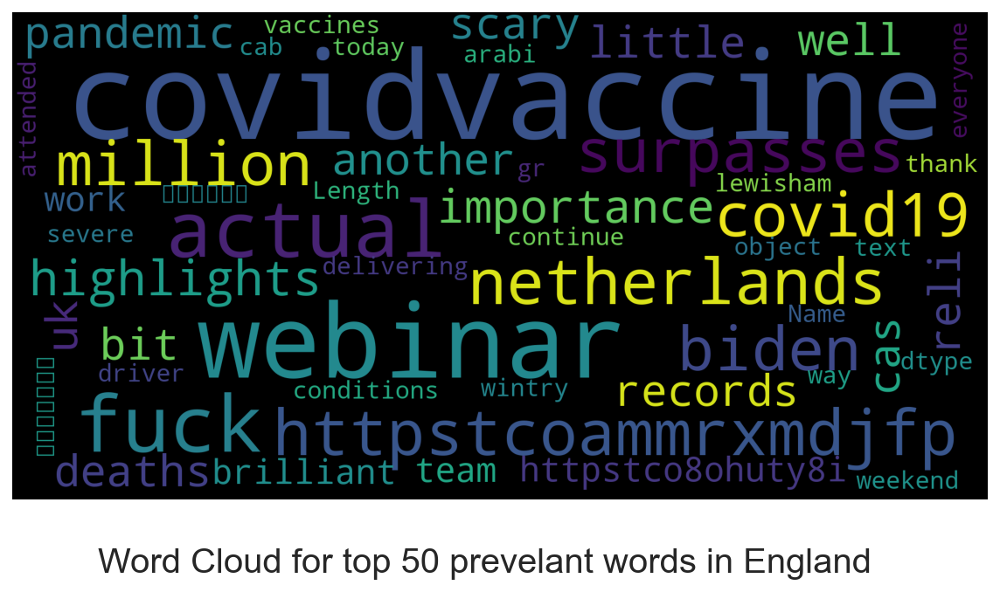

In [31]:
draw_word_cloud(covidvaccine_df, 'London, England', 'Word Cloud for top 50 prevelant words in England')

In [32]:
covidvaccine_df['hashtags'] = covidvaccine_df['hashtags'].fillna('[]')
covidvaccine_df['hashtags_count'] = covidvaccine_df['hashtags'].apply(lambda x: len(x.split(',')))
covidvaccine_df.loc[covidvaccine_df['hashtags'] == '[]', 'hashtags_count'] = 0

covidvaccine_df.head(5)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,tweets_count,created_day,created_time,year_created,hashtags_count
105150,Marcia Dorsey🌻⚜️🗽,The CITY of St. Louis,Mother of @jack... Does that make me the grand...,2006-04-03 16:00:21,12699.0,3814.0,153565.0,1,2021-01-29 14:45:31,#CovidVaccine Accomplished 🙏🏻,['CovidVaccine'],Twitter for iPhone,False,2,2006-04-03,16:00:21,2006.0,1
105149,Marcia Dorsey🌻⚜️🗽,"DowntownSTL, MO.",Mother of @jack... Does that make me the grand...,2006-04-03 16:00:21,12550.0,3808.0,153049.0,1,2021-01-24 00:29:06,Thank you all for sharing your #CovidVaccine ...,"['CovidVaccine', 'TheMoreYouKnow']",Twitter for iPhone,False,2,2006-04-03,16:00:21,2006.0,2
43362,Chris Messina 🥂,"Oakland, CA",#️⃣ Hashtag inventor ⠀ 🏆 #1 Product Hunter ⠀ S...,2006-07-16 06:53:48,108418.0,6640.0,26366.0,1,2020-12-26 06:45:03,Fascinating decoding of the #CovidVaccine:\n\n...,['CovidVaccine'],Twitter for iPhone,False,1,2006-07-16,06:53:48,2006.0,1
55267,Caz,NA,"Writers, Readers, LGBT progress/advocacy. Thea...",2006-07-17 23:49:42,764.0,899.0,36452.0,0,2020-12-30 17:13:46,Mississippi to open 18 drive-through locations...,['Covid_19'],Twitter for iPad,False,1,2006-07-17,23:49:42,2006.0,1
26541,Sumon Sadhu,NA,Entrepreneur. Angel investor in cos like @benc...,2006-09-08 20:39:02,3466.0,3131.0,4119.0,0,2020-11-09 15:11:22,Congratulations to Biontech. \n\nPfizer is the...,"['COVID19', 'covidvaccine']",Twitter for iPhone,False,1,2006-09-08,20:39:02,2006.0,2


In [33]:
covidvaccine_df['hashtags_count'].describe()

count    161242.000000
mean          1.389936
std           1.512789
min           0.000000
25%           0.000000
50%           1.000000
75%           2.000000
max          13.000000
Name: hashtags_count, dtype: float64

In [34]:
#Just split day and time into separate columns

covidvaccine_df['date'] = pd.to_datetime(covidvaccine_df['date'],  errors='coerce') 
covidvaccine_df = covidvaccine_df.sort_values(['date'])
covidvaccine_df['day'] = covidvaccine_df['date'].astype(str).str.split(' ', expand=True)[0]
covidvaccine_df['time'] = covidvaccine_df['date'].astype(str).str.split(' ', expand=True)[1]
covidvaccine_df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,tweets_count,created_day,created_time,year_created,hashtags_count,day,time
11169,SouthSide,NA,"‘ologist, Feminist, mother and grandmother. St...",2013-10-15 18:42:00,40.0,33.0,29884.0,0,2020-01-09 00:04:00,Don’t politicize the #CDC and the #FDA. I’m p...,"['CDC', 'FDA']",Twitter for iPhone,False,1,2013-10-15,18:42:00,2013.0,2,2020-01-09,00:04:00
11168,Candidate PAJ,NA,"Assuming Twitter exists in the future, let thi...",2019-01-18 02:06:00,2.0,166.0,41.0,0,2020-01-09 00:05:00,Whomever the President is needs to get the #co...,['covidvaccine'],Twitter for iPhone,False,1,2019-01-18,02:06:00,2019.0,1,2020-01-09,00:05:00
11167,💧Salty Noulty💧,"Brisbane, Australia","Inspiring carbon neutral living, science and h...",2007-09-28 19:20:00,398.0,602.0,11076.0,0,2020-01-09 00:09:00,@GregHuntMP You forgot to mention $5 million i...,['covidvaccine'],Twitter for iPhone,False,1,2007-09-28,19:20:00,2007.0,1,2020-01-09,00:09:00
11155,PETER MAER,"Washington, DC",Retired White House Corr. \nEdward R. Murrow A...,2010-12-03 15:20:00,13514.0,11646.0,1563.0,1,2020-01-09 00:49:00,Is Trump pressuring #FDA for an October #Covid...,"['FDA', 'Covidvaccine']",Twitter Web App,False,12,2010-12-03,15:20:00,2010.0,2,2020-01-09,00:49:00
11153,B Sabs,NA,Wife to my man of choice. Mother of 2 awesome ...,2014-09-09 16:09:00,100.0,316.0,19193.0,0,2020-01-09 00:59:00,Here we go. #COVIDvaccine https://t.co/FZgtcJ6XDP,['COVIDvaccine'],Twitter for iPhone,False,2,2014-09-09,16:09:00,2014.0,1,2020-01-09,00:59:00


In [35]:
ds = covidvaccine_df.groupby(['day', 'user_name'])['hashtags_count'].count().reset_index()
ds = ds.groupby(['day'])['user_name'].count().reset_index()
ds.columns = ['day', 'number_of_users']
ds['day'] = ds['day'].astype(str) + ':00:00:00'
fig = px.bar(
    ds, 
    x='day', 
    y="number_of_users", 
    orientation='v',
    title='Number of unique users per day', 
    width=800, 
    height=800
)
fig.show()

In [36]:
covidvaccine_df['hour'] = covidvaccine_df['date'].dt.hour
ds = covidvaccine_df['hour'].value_counts().reset_index()
ds.columns = ['hour', 'count']
ds['hour'] = 'Hour ' + ds['hour'].astype(str)
fig = px.bar(
    ds, 
    x="hour", 
    y="count", 
    orientation='v', 
    title='Tweets distribution over hours', 
    width=800
)
fig.show()

In [37]:
covidvaccine_df['location'] = covidvaccine_df['user_location'].str.split(',', expand=True)[1].str.lstrip().str.rstrip()
res = covidvaccine_df.groupby(['day', 'location'])['text'].count().reset_index()

In [38]:
country_dict = {}
for c in countries:
    country_dict[c.name] = c.alpha3
    
res['alpha3'] = res['location']
res = res.replace({"alpha3": country_dict})

country_list = ['England', 'United States', 'United Kingdom', 'London', 'UK']

res = res[
    (res['alpha3'] == 'USA') | 
    (res['location'].isin(country_list)) | 
    (res['location'] != res['alpha3'])
]

gbr = ['England', 'UK', 'London', 'United Kingdom']
us = ['United States', 'NY', 'CA', 'GA']

res = res[res['location'].notnull()]
res.loc[res['location'].isin(gbr), 'alpha3'] = 'GBR'
res.loc[res['location'].isin(us), 'alpha3'] = 'USA'
res.loc[res['alpha3'] == 'USA', 'location'] = 'USA'
res.loc[res['alpha3'] == 'GBR', 'location'] = 'United Kingdom'
plot = res.groupby(['day', 'location', 'alpha3'])['text'].sum().reset_index()
plot

,day,location,alpha3,text
0,2020-01-09,Australia,AUS,2
1,2020-01-09,Canada,CAN,1
2,2020-01-09,India,IND,9
3,2020-01-09,Spain,ESP,1
4,2020-01-09,Thailand,THA,1
...,...,...,...,...
2090,2021-03-12,USA,USA,270
2091,2021-03-12,Uganda,UGA,3
2092,2021-03-12,United Arab Emirates,ARE,3
2093,2021-03-12,United Kingdom,GBR,192


In [39]:
fig = px.choropleth(
    plot, 
    locations="alpha3",
    hover_name='location',
    color="text",
    animation_frame='day',
    projection="natural earth",
    color_continuous_scale=px.colors.sequential.Plasma,
    title='Tweets from different countries for every day',
    width=800, 
    height=600
)
fig.show()

In [40]:
res = covidvaccine_df.groupby(['day', 'location', 'user_name'])['text'].count().reset_index()
res = res[['day', 'location', 'user_name']]
res['alpha3'] = res['location']
res = res.replace({"alpha3": country_dict})

country_list = ['England', 'United States', 'United Kingdom', 'London', 'UK']

res = res[
    (res['alpha3'] == 'USA') | 
    (res['location'].isin(country_list)) | 
    (res['location'] != res['alpha3'])
]

gbr = ['England', 'UK', 'London', 'United Kingdom']
us = ['United States', 'NY', 'CA', 'GA']

res = res[res['location'].notnull()]
res.loc[res['location'].isin(gbr), 'alpha3'] = 'GBR'
res.loc[res['location'].isin(us), 'alpha3'] = 'USA'
res.loc[res['alpha3'] == 'USA', 'location'] = 'USA'
res.loc[res['alpha3'] == 'GBR', 'location'] = 'United Kingdom'
plot = res.groupby(['day', 'location', 'alpha3'])['user_name'].count().reset_index()

In [41]:
fig = px.choropleth(
    plot, 
    locations="alpha3",
    hover_name='location',
    color="user_name",
    animation_frame='day',
    projection="natural earth",
    color_continuous_scale=px.colors.sequential.Plasma,
    title='Numbers of active users for every day',
    width=800, 
    height=600
)
fig.show()

In [42]:
covidvaccine_df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,...,is_retweet,tweets_count,created_day,created_time,year_created,hashtags_count,day,time,hour,location
11169,SouthSide,NA,"‘ologist, Feminist, mother and grandmother. St...",2013-10-15 18:42:00,40.0,33.0,29884.0,0,2020-01-09 00:04:00,Don’t politicize the #CDC and the #FDA. I’m p...,...,False,1,2013-10-15,18:42:00,2013.0,2,2020-01-09,00:04:00,0.0,None
11168,Candidate PAJ,NA,"Assuming Twitter exists in the future, let thi...",2019-01-18 02:06:00,2.0,166.0,41.0,0,2020-01-09 00:05:00,Whomever the President is needs to get the #co...,...,False,1,2019-01-18,02:06:00,2019.0,1,2020-01-09,00:05:00,0.0,None
11167,💧Salty Noulty💧,"Brisbane, Australia","Inspiring carbon neutral living, science and h...",2007-09-28 19:20:00,398.0,602.0,11076.0,0,2020-01-09 00:09:00,@GregHuntMP You forgot to mention $5 million i...,...,False,1,2007-09-28,19:20:00,2007.0,1,2020-01-09,00:09:00,0.0,Australia
11155,PETER MAER,"Washington, DC",Retired White House Corr. \nEdward R. Murrow A...,2010-12-03 15:20:00,13514.0,11646.0,1563.0,1,2020-01-09 00:49:00,Is Trump pressuring #FDA for an October #Covid...,...,False,12,2010-12-03,15:20:00,2010.0,2,2020-01-09,00:49:00,0.0,DC
11153,B Sabs,NA,Wife to my man of choice. Mother of 2 awesome ...,2014-09-09 16:09:00,100.0,316.0,19193.0,0,2020-01-09 00:59:00,Here we go. #COVIDvaccine https://t.co/FZgtcJ6XDP,...,False,2,2014-09-09,16:09:00,2014.0,1,2020-01-09,00:59:00,0.0,None


In [43]:
covidvaccine_df.drop(['user_location','user_description','user_created','user_followers','user_friends','user_favourites','user_verified','hashtags_count','year_created','is_retweet', 'source', 'hashtags', 'date', 'location','hour', 'year_created','created_day','created_time','hour','user_location'], axis = 1, inplace = True)
covidvaccine_df.drop_duplicates()
covidvaccine_df.head()

,user_name,text,tweets_count,day,time
11169,SouthSide,Don’t politicize the #CDC and the #FDA. I’m p...,1,2020-01-09,00:04:00
11168,Candidate PAJ,Whomever the President is needs to get the #co...,1,2020-01-09,00:05:00
11167,💧Salty Noulty💧,@GregHuntMP You forgot to mention $5 million i...,1,2020-01-09,00:09:00
11155,PETER MAER,Is Trump pressuring #FDA for an October #Covid...,12,2020-01-09,00:49:00
11153,B Sabs,Here we go. #COVIDvaccine https://t.co/FZgtcJ6XDP,2,2020-01-09,00:59:00


In [44]:
covidvaccine_df.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 161242 entries, 11169 to 135291
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   user_name     161242 non-null  object
 1   text          161242 non-null  object
 2   tweets_count  161242 non-null  int64 
 3   day           161242 non-null  object
 4   time          161238 non-null  object
dtypes: int64(1), object(4)
memory usage: 7.4+ MB


In [45]:
covidvaccine_df = covidvaccine_df.rename(columns={'text': 'tweet', 'day': 'date'})
covidvaccine_df.head()

,user_name,tweet,tweets_count,date,time
11169,SouthSide,Don’t politicize the #CDC and the #FDA. I’m p...,1,2020-01-09,00:04:00
11168,Candidate PAJ,Whomever the President is needs to get the #co...,1,2020-01-09,00:05:00
11167,💧Salty Noulty💧,@GregHuntMP You forgot to mention $5 million i...,1,2020-01-09,00:09:00
11155,PETER MAER,Is Trump pressuring #FDA for an October #Covid...,12,2020-01-09,00:49:00
11153,B Sabs,Here we go. #COVIDvaccine https://t.co/FZgtcJ6XDP,2,2020-01-09,00:59:00


In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import collections
import re
import networkx as nx

import nltk
from nltk.corpus import stopwords
stopwords=set(stopwords.words('english'))
from nltk.util import ngrams
from nltk import bigrams
nltk.download('stopwords')

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
%config InlineBackend.figure_format = 'retina'

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nimes\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [47]:
df_new = covidvaccine_df[covidvaccine_df['tweet'].notnull()]
df_new['text'] = df_new['tweet'].apply(lambda x: ' '.join([item for item in x.split() if item not in stopwords]))
print(df_new)

                                                user_name  \
11169                                           SouthSide   
11168                                       Candidate PAJ   
11167                                      💧Salty Noulty💧   
11155                                          PETER MAER   
11153                                              B Sabs   
...                                                   ...   
62575                                      George Jackson   
54610                         265208E2 #BeyHive #SameLove   
79887                     #GoBucks #GoReds #GoBrowns #CBJ   
101827   A person of little confidence but many convic...   
135291   see our website for details about the service...   

                                                    tweet  tweets_count  \
11169   Don’t politicize the #CDC and the #FDA.  I’m p...             1   
11168   Whomever the President is needs to get the #co...             1   
11167   @GregHuntMP You forgot to mention 

In [48]:
#Remove Urls and HTML links
def remove_urls(text):
    url_remove = re.compile(r'https?://\S+|www\.\S+')
    return url_remove.sub(r'', text)
df_new['text']=df_new['text'].apply(lambda x:remove_urls(x))

def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)
df_new['text']=df_new['text'].apply(lambda x:remove_html(x))

# Lower casing
def lower(text):
    low_text= text.lower()
    return low_text
df_new['text']=df_new['text'].apply(lambda x:lower(x))

# Number removal
def remove_num(text):
    remove= re.sub(r'\d+', '', text)
    return remove
df_new['text']=df_new['text'].apply(lambda x:remove_num(x))

def punct_remove(text):
    punct = re.sub(r"[^\w\s\d]","", text)
    return punct
df_new['text']=df_new['text'].apply(lambda x:punct_remove(x))

def remove_mention(x):
    text=re.sub(r'@\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_mention(x))

def remove_hash(x):
    text=re.sub(r'#\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_hash(x))

#Remove extra white space left while removing stuff
def remove_space(text):
    space_remove = re.sub(r"\s+"," ",text).strip()
    return space_remove
df_new['text']=df_new['text'].apply(lambda x:remove_space(x))

###########################################################################################################

'''
def clean(text):
    text = re.sub('https?://\S+|www\.\S+', '', text)  
    text = re.sub(r'\s+', ' ', text, flags=re.I)
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub(r'@\w+','',text)
    text = re.sub(r'#\w+','',text)
    return text   
df_new['text'] = df_new['text'].apply(lambda x:clean(x))
'''
#All the lexical features were rated for the polarity and intensity on a scale from “-4: Extremely Negative” to “+4 Extremely Positive


from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

new_words = {
    'positive covid': -3.0,
    'positive cases': -3.0,
    'tested positive': -3.0,
    'tests positive': -3.0,
}

analyser = SentimentIntensityAnalyzer()
analyser.lexicon.update(new_words)

scores=[]
for i in range(len(df_new['text'])):
    
    score = analyser.polarity_scores(df_new['text'][i])
    score=score['compound']
    scores.append(score)
sentiment=[]
for i in scores:
    if i>=0.05:
        sentiment.append('Positive')
    elif i<=(-0.05):
        sentiment.append('Negative')
    else:
        sentiment.append('Neutral')
df_new['sentiment']=pd.Series(np.array(sentiment))

In [49]:
df_new.head()

,user_name,tweet,tweets_count,date,time,text,sentiment
11169,SouthSide,Don’t politicize the #CDC and the #FDA. I’m p...,1,2020-01-09,00:04:00,dont politicize cdc fda im perfectly happy wai...,Positive
11168,Candidate PAJ,Whomever the President is needs to get the #co...,1,2020-01-09,00:05:00,whomever president needs get covidvaccine live...,Neutral
11167,💧Salty Noulty💧,@GregHuntMP You forgot to mention $5 million i...,1,2020-01-09,00:09:00,greghuntmp you forgot mention million funding ...,Neutral
11155,PETER MAER,Is Trump pressuring #FDA for an October #Covid...,12,2020-01-09,00:49:00,is trump pressuring fda october covidvaccine s...,Negative
11153,B Sabs,Here we go. #COVIDvaccine https://t.co/FZgtcJ6XDP,2,2020-01-09,00:59:00,here go covidvaccine,Neutral


In [50]:
# format timestamp
df_new['created_at'] = pd.to_datetime(df_new['date'])
df_new['created_at'] = pd.IntervalIndex(pd.cut(df_new['created_at'], pd.date_range('2020-01-09', '2021-02-28',freq='2880T'))).left

# count sentiment
tweet_count1 = df_new.groupby(['created_at','sentiment'])['text'].count().reset_index().rename(columns={'text':'count'})
tweet_count1.head(5)

# check missing values
# tweet_count1.isna().sum()

,created_at,sentiment,count
0,2020-02-08,Negative,42
1,2020-02-08,Neutral,53
2,2020-02-08,Positive,45
3,2020-03-07,Negative,45
4,2020-03-07,Neutral,77


<function matplotlib.pyplot.show(close=None, block=None)>

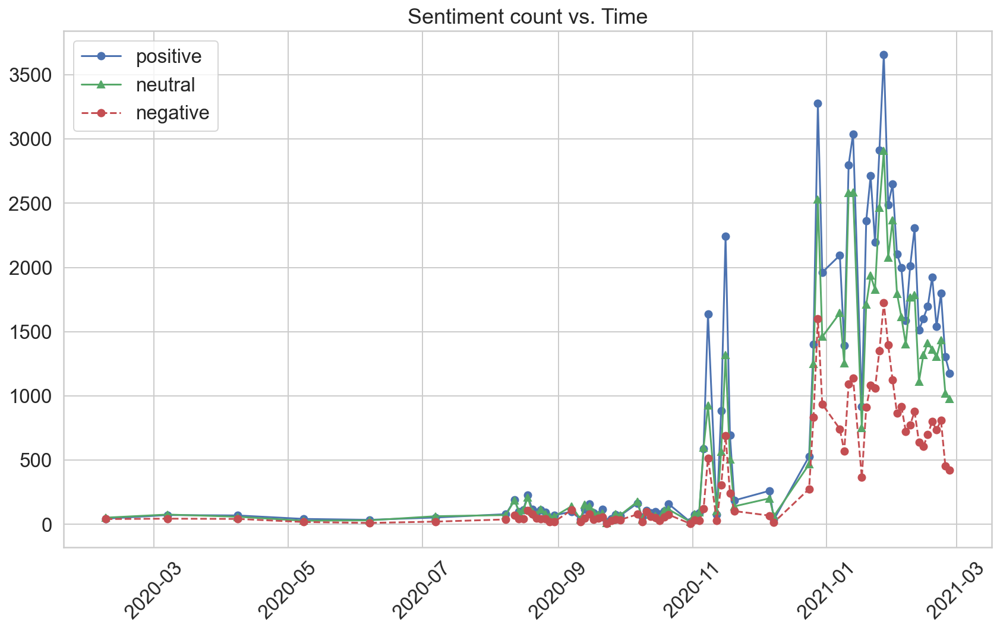

In [51]:
#format sentiment table
times = tweet_count1.loc[tweet_count1['sentiment'] == 'Negative']['created_at'].reset_index(drop = True)
pos = tweet_count1.loc[tweet_count1['sentiment'] == 'Positive']['count'].reset_index(drop = True)
neu = tweet_count1.loc[tweet_count1['sentiment'] == 'Neutral']['count'].reset_index(drop = True)
neg = tweet_count1.loc[tweet_count1['sentiment'] == 'Negative']['count'].reset_index(drop = True)

plt.figure(figsize=(14,8))
plt.xticks(rotation='45')
plt.title("Sentiment count vs. Time")

lin1=plt.plot(times, pos, 'bo-', label='positive')
lin2=plt.plot(times, neu, 'g^-', label='neutral')
lin3=plt.plot(times, neg, 'ro--', label='negative')
plt.legend()
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

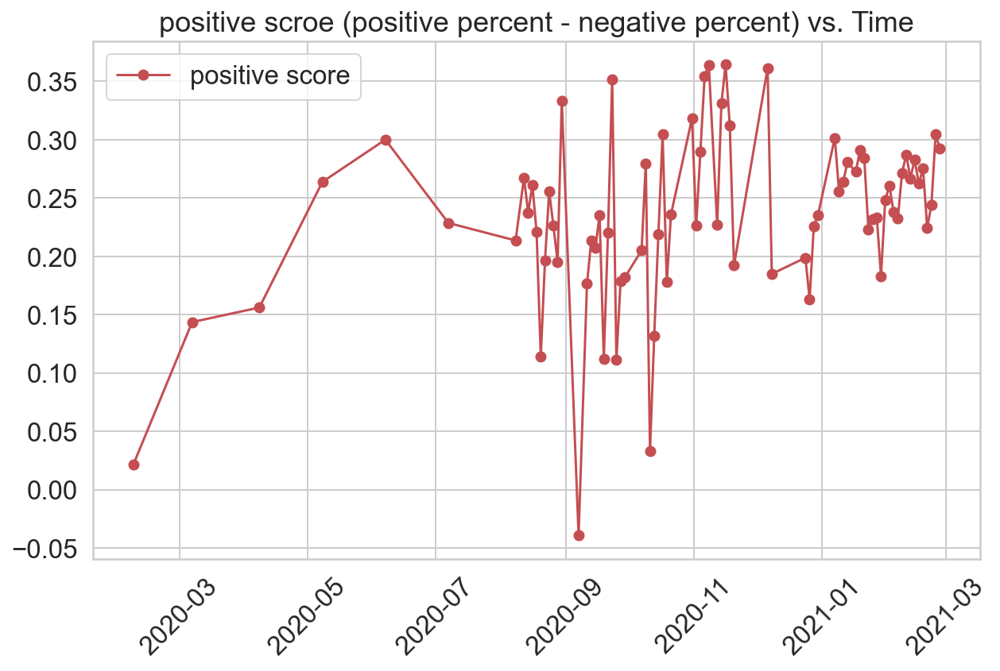

In [52]:
# "score" is defined as percent of positive tweets minus percent of negative tweets
score = (pos - neg) / (pos + neu + neg)

plt.figure(figsize=(10,6))
plt.xticks(rotation='45')
plt.title("positive scroe (positive percent - negative percent) vs. Time")

lin1=plt.plot(times, score, 'ro-', label='positive score')
plt.legend()
plt.show

(-0.5, 399.5, 199.5, -0.5)

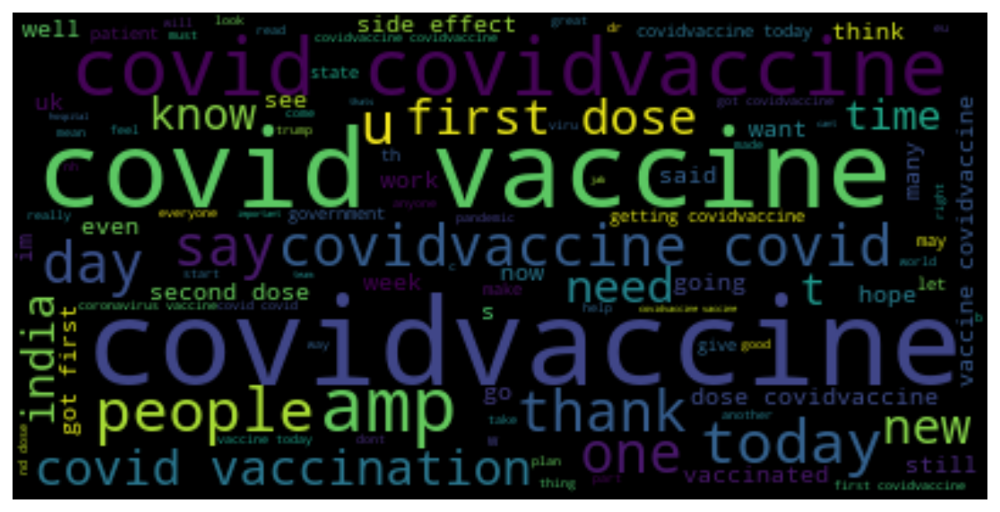

In [53]:
from wordcloud import WordCloud, STOPWORDS , ImageColorGenerator

tweet_All = " ".join(review for review in df_new.text)


fig, ax = plt.subplots(1, 1, figsize  = (16,5))
# Create and generate a word cloud image:
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(tweet_All)

# Display the generated image:
ax.imshow(wordcloud_ALL, interpolation='bilinear')

ax.axis('off')

In [54]:
df_new['text']

11169     dont politicize cdc fda im perfectly happy wai...
11168     whomever president needs get covidvaccine live...
11167     greghuntmp you forgot mention million funding ...
11155     is trump pressuring fda october covidvaccine s...
11153                                  here go covidvaccine
                                ...                        
62575     republicans trying sabotage bidens covidvaccin...
54610                                       twitter android
79887                                       twitter android
101827                                      twitter web app
135291                                       twitter iphone
Name: text, Length: 161242, dtype: object

In [55]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,text
2,Positive,72014
1,Neutral,58563
0,Negative,30665


<AxesSubplot:xlabel='sentiment', ylabel='count'>

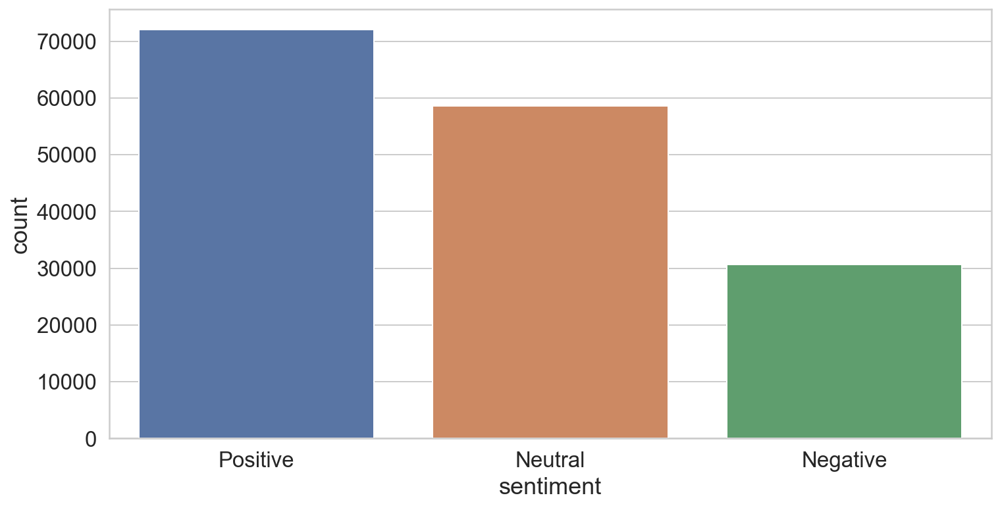

In [56]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [57]:
import plotly.graph_objs as go

fig = go.Figure(go.Funnelarea(
    text =temp.sentiment,
    values = temp.text,
    title = {"position": "top center", "text": "Funnel-Chart of Sentiment Distribution"}
    ))
fig.show()

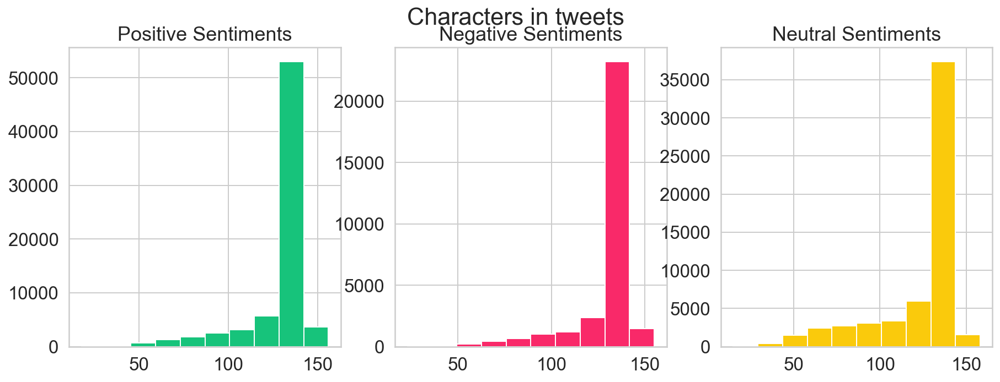

In [58]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.len()
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')

tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.len()
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.len()
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Characters in tweets')
plt.show()

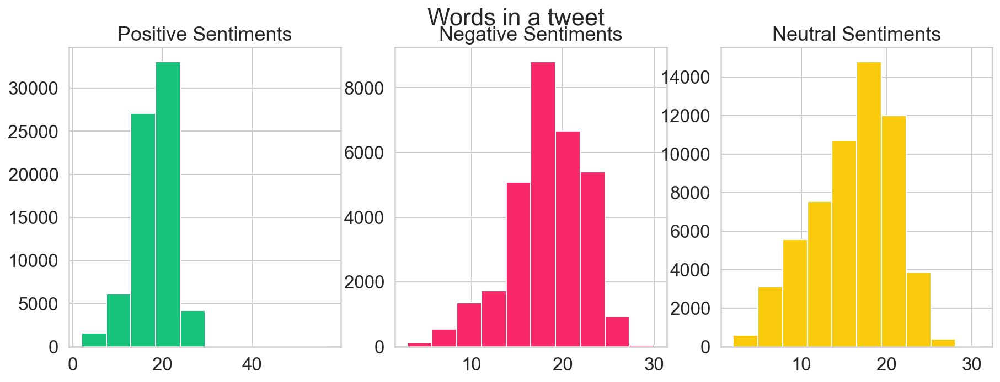

In [59]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().map(lambda x: len(x))
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')


tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().map(lambda x: len(x))
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.split().map(lambda x: len(x))
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Words in a tweet')
plt.show()

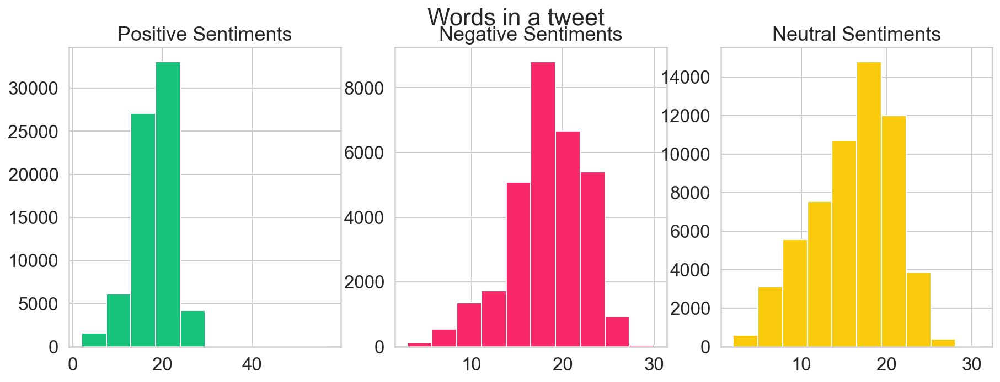

In [60]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().map(lambda x: len(x))
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')


tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().map(lambda x: len(x))
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.split().map(lambda x: len(x))
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Words in a tweet')
plt.show()

Text(0.5, 0.98, 'Average word length in each tweet')

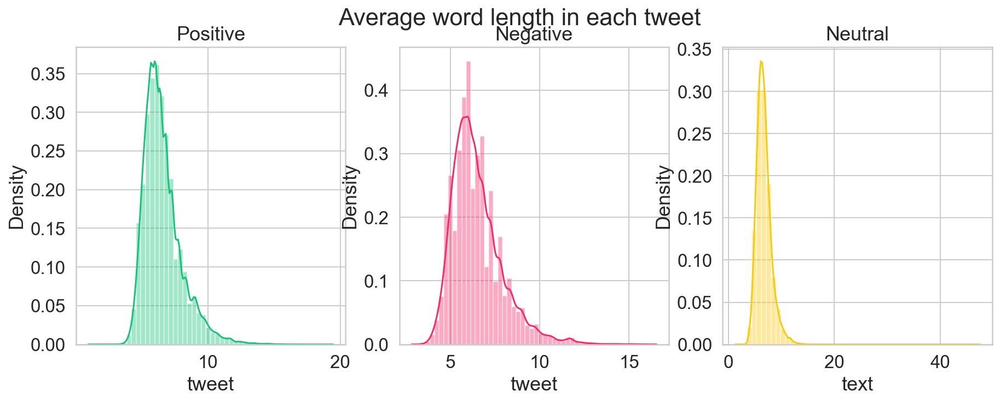

In [61]:
fig,(ax1,ax2, ax3)=plt.subplots(1,3,figsize=(15,5))

word=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1,color='#17C37B')
ax1.set_title('Positive')


word=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='#F92969')
ax2.set_title('Negative')

word=df_new[df_new['sentiment']=="Neutral"]['text'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax3,color='#FACA0C')
ax3.set_title('Neutral')


fig.suptitle('Average word length in each tweet')

In [62]:
np.array(stopwords)

array({'isn', 'through', 'how', 'if', "hadn't", 'y', 'shouldn', 'my', 'ma', 'while', "you'll", "you'd", 'until', 'such', 'when', 'but', 'once', "that'll", 'that', 'who', 'hadn', "weren't", 'with', 'just', 'under', 'own', 'and', 'them', 'doesn', 'him', 'your', 'his', 'an', 'after', 'out', 'having', 'yourself', 'whom', 're', 'yourselves', 'then', 't', 'doing', 'were', "shan't", 'her', 'won', 'by', 'a', 'here', "haven't", 'does', "wasn't", "needn't", 'you', 'because', 'o', 'do', 'from', 'd', 'these', 'their', 'only', 'why', 'too', 'didn', 'not', 'been', 'in', 'they', 'is', 'again', 'between', 'than', 'ourselves', 'its', 'she', 'don', 'no', 'have', 'we', 'wasn', 'to', 'both', 'shan', 'herself', 'against', 'at', 's', 'weren', 'was', 'below', "it's", "you've", "mustn't", 'himself', 'themselves', 'are', 'theirs', 'so', 'll', 'over', 'any', 'very', 'me', 'will', 'into', 'our', 'm', 'during', 'more', "should've", 'this', 'for', 'haven', 'which', 'i', 'did', 'about', 'as', 'had', 'off', 'most', 

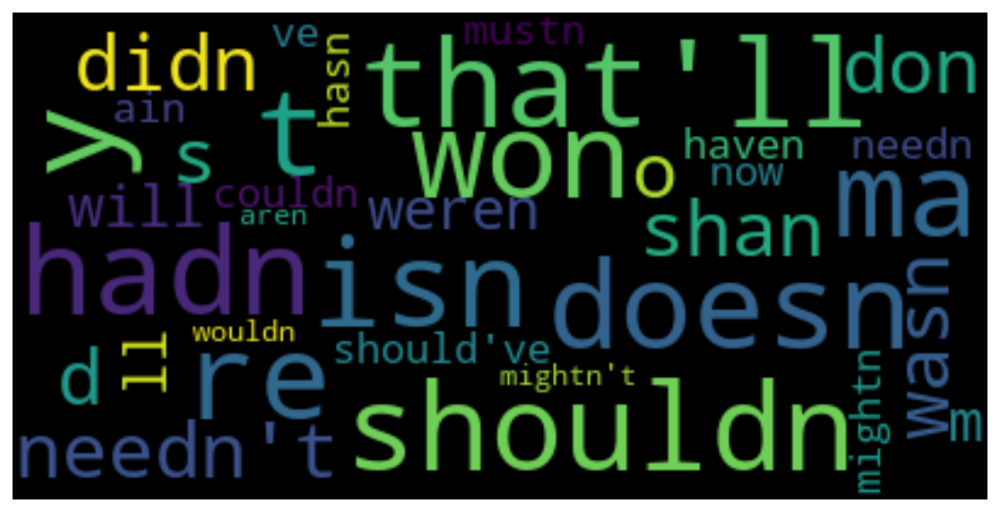

In [63]:
comment_words = '' 
stopwords1 = set(STOPWORDS) 
  
for val in stopwords: 
      
    # typecaste each val to string 
    val = str(val) 
    # split the value 
    tokens = val.split() 
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
fig, ax = plt.subplots(1, 1, figsize  = (16,5))
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(comment_words)



# plot the WordCloud image                        
ax.imshow(wordcloud_ALL, interpolation='bilinear')
ax.axis('off')
  
plt.show() 

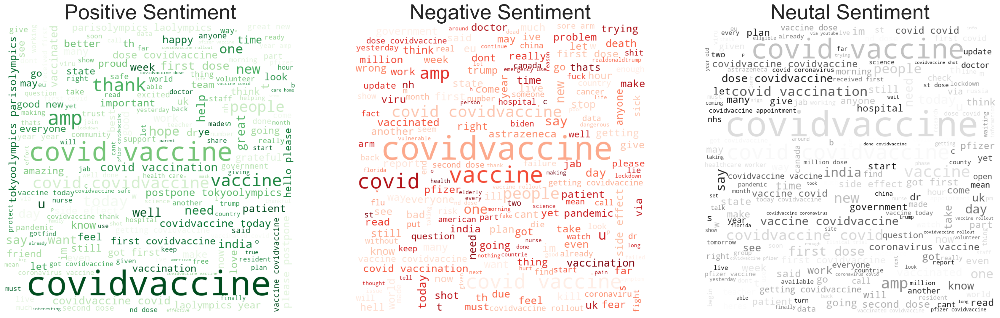

In [64]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=[30, 15])

df_pos = df_new[df_new["sentiment"]=="Positive"]
df_neg = df_new[df_new["sentiment"]=="Negative"]
df_neu = df_new[df_new["sentiment"]=="Neutral"]

comment_words = '' 
stopwords = set(STOPWORDS) 

for val in df_pos.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
   
wordcloud1 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greens",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 

ax1.imshow(wordcloud1)
ax1.axis('off')
ax1.set_title('Positive Sentiment',fontsize=35);

comment_words = ''

for val in df_neg.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud2 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Reds",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words)  
ax2.imshow(wordcloud2)
ax2.axis('off')
ax2.set_title('Negative Sentiment',fontsize=35);

comment_words = ''
for val in df_neu.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud3 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greys",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
ax3.imshow(wordcloud3)
ax3.axis('off')
ax3.set_title('Neutal Sentiment',fontsize=35);

In [65]:
from collections import defaultdict

# Define functions
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(' ') if token != '' if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

N = 30


positive= df_new["sentiment"]== "Positive"
negative= df_new["sentiment"]== "Negative"
neutral= df_new["sentiment"]== "Neutral"

positive_unigrams = defaultdict(int)
neutral_unigrams = defaultdict(int)
negative_unigrams = defaultdict(int)

# Unigrams
for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet):
        positive_unigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet):
        negative_unigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet):
        neutral_unigrams[word] += 1        
        
df_positive_unigrams = pd.DataFrame(sorted(positive_unigrams.items(), key=lambda x: x[1])[::-1])
df_negative_unigrams = pd.DataFrame(sorted(negative_unigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_unigrams = pd.DataFrame(sorted(neutral_unigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=150)
plt.tight_layout()

sns.barplot(y=df_positive_unigrams[0].values[:N], x=df_positive_unigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_unigrams[0].values[:N], x=df_negative_unigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_unigrams[0].values[:N], x=df_neutral_unigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common unigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common unigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common unigrams in Neutral Tweets', fontsize=15)

plt.show()

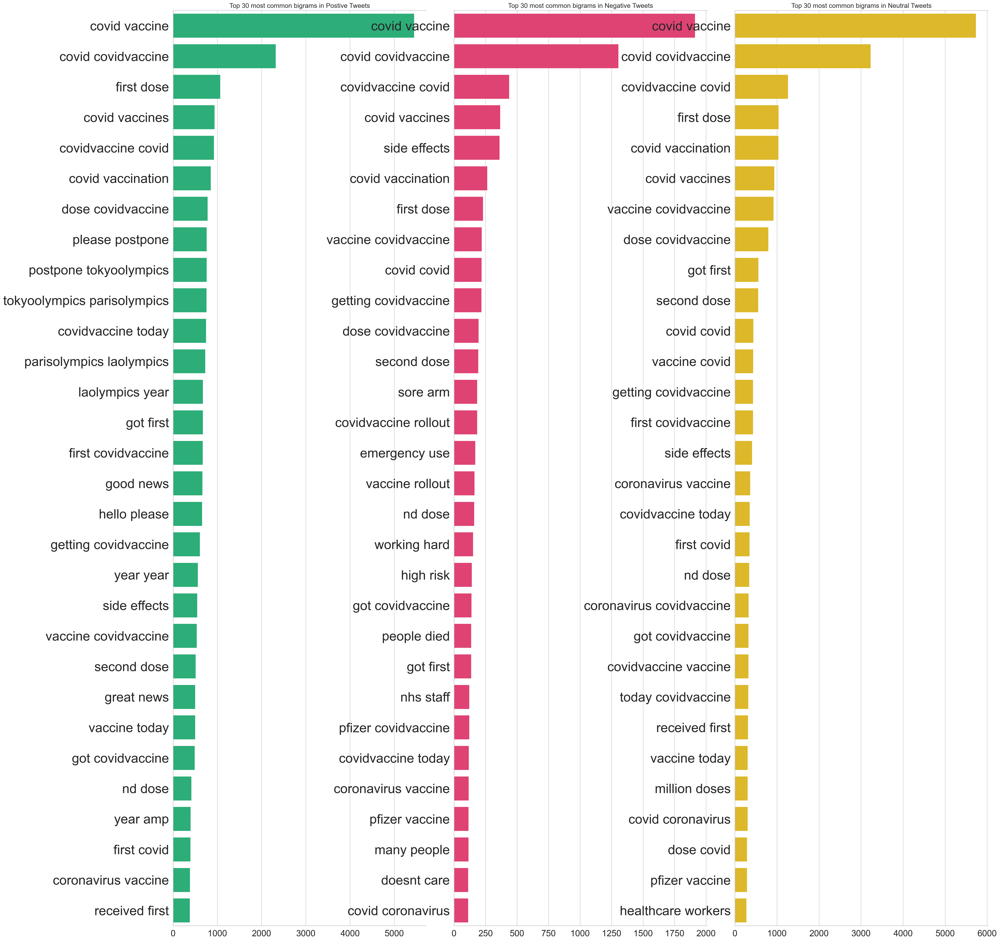

In [66]:
# Bigrams
positive_bigrams = defaultdict(int)
neutral_bigrams = defaultdict(int)
negative_bigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        positive_bigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        negative_bigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        neutral_bigrams[word] += 1        
        
df_positive_bigrams = pd.DataFrame(sorted(positive_bigrams.items(), key=lambda x: x[1])[::-1])
df_negative_bigrams = pd.DataFrame(sorted(negative_bigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_bigrams = pd.DataFrame(sorted(neutral_bigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_bigrams[0].values[:N], x=df_positive_bigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_bigrams[0].values[:N], x=df_negative_bigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_bigrams[0].values[:N], x=df_neutral_bigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common bigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common bigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common bigrams in Neutral Tweets', fontsize=15)

plt.show()

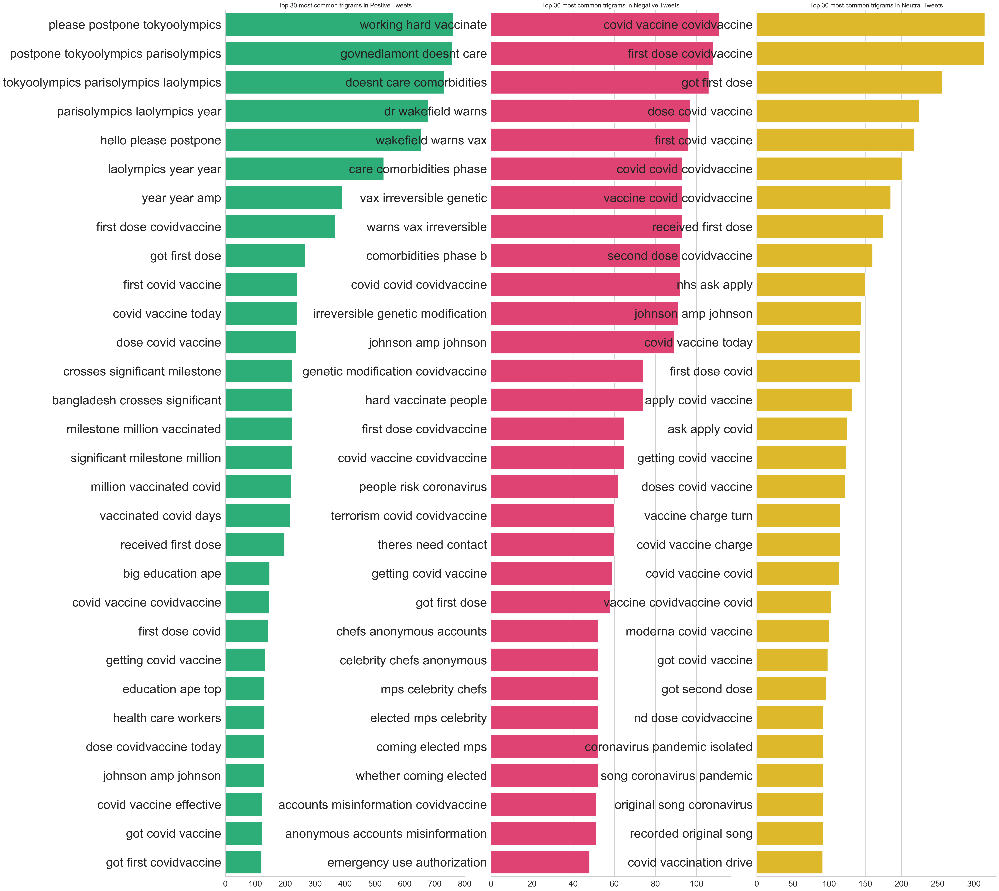

In [67]:
# Trigrams
positive_trigrams = defaultdict(int)
neutral_trigrams = defaultdict(int)
negative_trigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        positive_trigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        negative_trigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        neutral_trigrams[word] += 1        
        
df_positive_trigrams = pd.DataFrame(sorted(positive_trigrams.items(), key=lambda x: x[1])[::-1])
df_negative_trigrams = pd.DataFrame(sorted(negative_trigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_trigrams = pd.DataFrame(sorted(neutral_trigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_trigrams[0].values[:N], x=df_positive_trigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_trigrams[0].values[:N], x=df_negative_trigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_trigrams[0].values[:N], x=df_neutral_trigrams[1].values[:N], ax=axes[2], color='#FACA0C')




for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common trigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common trigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common trigrams in Neutral Tweets', fontsize=15)

plt.show()

In [68]:
df_new.head()

,user_name,tweet,tweets_count,date,time,text,sentiment,created_at
11169,SouthSide,Don’t politicize the #CDC and the #FDA. I’m p...,1,2020-01-09,00:04:00,dont politicize cdc fda im perfectly happy wai...,Positive,NaT
11168,Candidate PAJ,Whomever the President is needs to get the #co...,1,2020-01-09,00:05:00,whomever president needs get covidvaccine live...,Neutral,NaT
11167,💧Salty Noulty💧,@GregHuntMP You forgot to mention $5 million i...,1,2020-01-09,00:09:00,greghuntmp you forgot mention million funding ...,Neutral,NaT
11155,PETER MAER,Is Trump pressuring #FDA for an October #Covid...,12,2020-01-09,00:49:00,is trump pressuring fda october covidvaccine s...,Negative,NaT
11153,B Sabs,Here we go. #COVIDvaccine https://t.co/FZgtcJ6XDP,2,2020-01-09,00:59:00,here go covidvaccine,Neutral,NaT


In [69]:
len(df_new)

161242

In [70]:
df_new = df_new.drop(df_new[df_new.tweets_count >= 10].index)
df_new = df_new.sample(frac=1).reset_index(drop=True)
df_new.head()
len(df_new)

116597

<AxesSubplot:xlabel='sentiment', ylabel='count'>

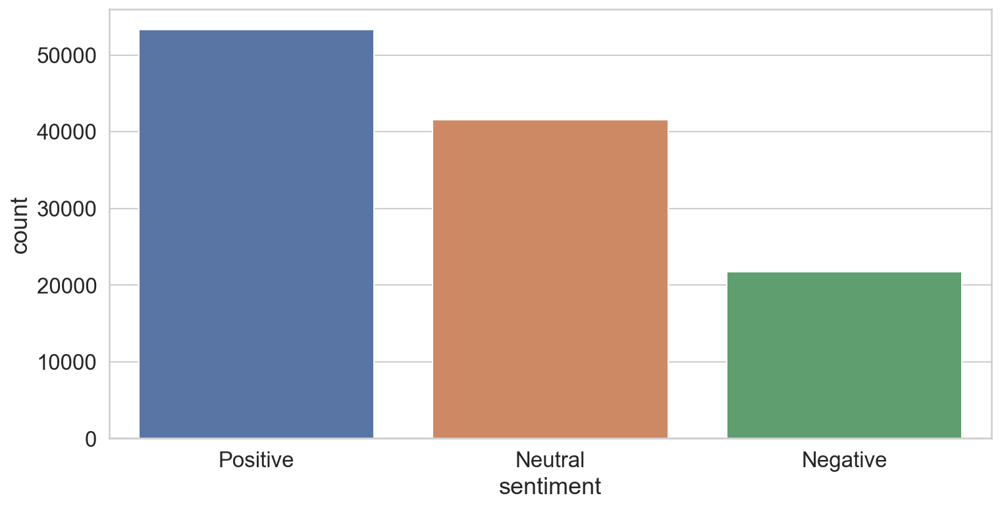

In [71]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [72]:
import plotly.graph_objs as go

fig = go.Figure(go.Funnelarea(
    text =temp.sentiment,
    values = temp.text,
    title = {"position": "top center", "text": "Funnel-Chart of Sentiment Distribution"}
    ))
fig.show()

In [73]:
df_new_final = pd.concat([df_new.iloc[0:40000]])

In [74]:
len(df_new_final)

40000

In [75]:
export_csv = df_neg.to_csv(r'covid19 vaccine tweets.csv')